# UTOR: FinTech Bootcamp - Project 1: Stock Portfolio Optimizer

## Import Libraries

In [1]:
# Import libraries

import numpy as np
import pandas as pd
from pandas_datareader import data
import plotly.express as px
import matplotlib.pyplot as plt
import datetime
import plotly.graph_objects as go
import plotly.io as pio
from datetime import timedelta
from MCForecastTools import MCSimulation

## User Input

In [2]:
# Yahoo finance API data input
 ## JPMorgan Chase & Co, Apple Inc., Walmart Inc., Chevron Corporation, UnitedHealth Group Inc.
stocks = ['JPM', 'AAPL', 'WMT', 'CVX', 'UNH']
 ## Dow Jones Industrial Average
benchmark = ['^DJI']

start_date = '2008/01/01'
end_date = '2022/09/30'

out_sample_days_held_back = 252

# Plotly graph themes
#Example themes - ["plotly", "plotly_white", "plotly_dark", "ggplot2", "seaborn", "simple_white", "none"]
theme='seaborn'

# Set random seed - for optimal portfolio weight calculation
seed=42
np.random.seed(seed)

# Monte Carlo Simulation
number_simulation = 500
years = 5

init_investment = 10000

## Import and Clean Stock Data

In [3]:
# Import Stock data 

df = data.DataReader(stocks, 'yahoo', start=start_date, end=end_date)
display(df.head())
display(df.tail())

Attributes  Adj Close                                                 Close  \
Symbols           JPM      AAPL        WMT        CVX        UNH        JPM   
Date                                                                          
2008-01-02  29.190405  5.941449  33.677521  52.631077  46.735241  42.169998   
2008-01-03  28.989660  5.944196  33.304134  53.278675  46.949669  41.880001   
2008-01-04  28.332067  5.490445  32.830204  52.569134  46.182693  40.930000   
2008-01-07  28.615870  5.416954  33.433376  51.882111  46.908432  41.340000   
2008-01-08  27.480656  5.222098  33.009716  51.217609  46.355877  39.700001   

Attributes                                             ...       Open  \
Symbols         AAPL        WMT        CVX        UNH  ...        JPM   
Date                                                   ...              
2008-01-02  6.958571  46.900002  93.459999  56.669998  ...  43.549999   
2008-01-03  6.961786  46.380001  94.610001  56.930000  ...  42.340000   
2008-01-04  6.430357  45.720001  93.349998  56.000000  ...  41.410000   
2008-01-07  6.344286  46.560001  92.129997  56.880001  ...  41.099998   
2008-01-08  6.116071  45.970001  90.949997  56.209999  ...  41.459999   

Attributes                                                 Volume  \
Symbols         AAPL        WMT        CVX        UNH         JPM   
Date                                                                
2008-01-02  7.116786  47.410000  93.959999  57.189999  22122300.0   
2008-01-03  6.978929  46.720001  93.800003  56.750000  17150700.0   
2008-01-04  6.837500  45.910000  93.879997  56.560001  25873800.0   
2008-01-07  6.473214  45.799999  93.739998  55.540001  25644100.0   
2008-01-08  6.433571  46.590000  92.410004  57.049999  33646000.0   

Attributes                                                   
Symbols             AAPL         WMT         CVX        UNH  
Date                                                         
2008-01-02  1.079179e+09  19918600.0   9058000.0  7698700.0  
2008-01-03  8.420664e+08  19801000.0  10479200.0  4864000.0  
2008-01-04  1.455832e+09  20351200.0  13103800.0  7250600.0  
2008-01-07  2.072193e+09  20326500.0  12892200.0  6093200.0  
2008-01-08  1.523816e+09  19017100.0  10987700.0  8142700.0  

[5 rows x 30 columns]

Attributes   Adj Close                                                  \
Symbols            JPM        AAPL         WMT         CVX         UNH   
Date                                                                     
2022-09-26  106.790001  150.770004  131.309998  140.960007  508.359985   
2022-09-27  105.849998  151.759995  130.949997  141.020004  508.369995   
2022-09-28  107.989998  149.839996  133.110001  145.779999  513.940002   
2022-09-29  106.160004  142.479996  132.250000  144.770004  508.829987   
2022-09-30  104.500000  138.199997  129.699997  143.669998  505.040009   

Attributes       Close                                                  ...  \
Symbols            JPM        AAPL         WMT         CVX         UNH  ...   
Date                                                                    ...   
2022-09-26  106.790001  150.770004  131.309998  140.960007  508.359985  ...   
2022-09-27  105.849998  151.759995  130.949997  141.020004  508.369995  ...   
2022-09-28  107.989998  149.839996  133.110001  145.779999  513.940002  ...   
2022-09-29  106.160004  142.479996  132.250000  144.770004  508.829987  ...   
2022-09-30  104.500000  138.199997  129.699997  143.669998  505.040009  ...   

Attributes        Open                                                  \
Symbols            JPM        AAPL         WMT         CVX         UNH   
Date                                                                     
2022-09-26  108.000000  149.660004  128.750000  143.570007  507.390015   
2022-09-27  107.750000  152.740005  132.229996  142.289993  510.369995   
2022-09-28  105.949997  147.639999  131.410004  142.080002  506.480011   
2022-09-29  106.949997  146.100006  133.500000  144.509995  514.770020   
2022-09-30  106.059998  141.279999  132.240005  144.029999  511.100006   

Attributes      Volume                                                 
Symbols            JPM         AAPL        WMT         CVX        UNH  
Date                                                                   
2022-09-26  15753600.0   93339400.0  7670400.0   9444000.0  2867400.0  
2022-09-27  12793600.0   84442700.0  5723900.0  10121000.0  2583400.0  
2022-09-28  12762600.0  146691400.0  5612800.0   8279800.0  3027300.0  
2022-09-29  12713900.0  128138200.0  5080500.0   8197600.0  2392000.0  
2022-09-30  15951900.0  124705400.0  6517900.0   9397400.0  3114900.0  

[5 rows x 30 columns]

In [4]:
# Closing price

df = df['Adj Close']
display(df.head())

Symbols,JPM,AAPL,WMT,CVX,UNH
Date,,,,,
2008-01-02,29.190405,5.941449,33.677521,52.631077,46.735241
2008-01-03,28.989660,5.944196,33.304134,53.278675,46.949669
2008-01-04,28.332067,5.490445,32.830204,52.569134,46.182693
2008-01-07,28.615870,5.416954,33.433376,51.882111,46.908432
2008-01-08,27.480656,5.222098,33.009716,51.217609,46.355877


In [6]:
# Calculate Stocks percentage change 
stock_returns = pd.DataFrame()

stock_returns['JPM_Returns'] = df['JPM'].pct_change()
stock_returns['AAPL_Returns'] = df['AAPL'].pct_change()
stock_returns['WMT_Returns'] = df['WMT'].pct_change()
stock_returns['CVX_Returns'] = df['CVX'].pct_change()
stock_returns['UNH_Returns'] = df['UNH'].pct_change()

stock_returns = stock_returns.dropna()

stock_returns.head()

,JPM_Returns,AAPL_Returns,WMT_Returns,CVX_Returns,UNH_Returns
Date,,,,,
2008-01-03,-0.006877,0.000462,-0.011087,0.012304,0.004588
2008-01-04,-0.022684,-0.076335,-0.014230,-0.013318,-0.016336
2008-01-07,0.010017,-0.013385,0.018372,-0.013069,0.015715
2008-01-08,-0.039671,-0.035971,-0.012672,-0.012808,-0.011779
2008-01-09,0.014106,0.047591,0.020231,0.017812,-0.000356


In [17]:
#Here we slice the dataframe to create backtesting data and out of sample data

count = df.shape[0] - out_sample_days_held_back

stock_returns_excl_ly = stock_returns.iloc[0:count,:]
last_year_stock_returns = stock_returns.iloc[count:,:]

 ## Complete data
display(stock_returns.tail())       
 ## Backtesting data
display(stock_returns_excl_ly.tail())
 ## Out of sample data
display(last_year_stock_returns.head())


,JPM_Returns,AAPL_Returns,WMT_Returns,CVX_Returns,UNH_Returns
Date,,,,,
2022-09-26,-0.021532,0.002260,0.009611,-0.026318,-0.010222
2022-09-27,-0.008802,0.006566,-0.002742,0.000426,0.000020
2022-09-28,0.020217,-0.012652,0.016495,0.033754,0.010957
2022-09-29,-0.016946,-0.049119,-0.006461,-0.006928,-0.009943
2022-09-30,-0.015637,-0.030039,-0.019282,-0.007598,-0.007448


,JPM_Returns,AAPL_Returns,WMT_Returns,CVX_Returns,UNH_Returns
Date,,,,,
2021-09-27,0.024166,-0.010550,-0.006426,0.023559,-0.004446
2021-09-28,-0.005390,-0.023801,-0.012302,0.003787,-0.016409
2021-09-29,-0.000783,0.006483,-0.000427,-0.000290,0.004491
2021-09-30,-0.013619,-0.009312,-0.007548,-0.018194,-0.024150
2021-10-01,0.021015,0.008127,-0.016717,0.028388,0.004325


,JPM_Returns,AAPL_Returns,WMT_Returns,CVX_Returns,UNH_Returns
Date,,,,,
2021-10-04,-0.001077,-0.024606,-0.009632,0.003738,-0.013811
2021-10-05,0.016330,0.014158,0.006557,0.010886,0.016589
2021-10-06,0.002134,0.006307,0.007320,-0.008785,0.002084
2021-10-07,0.006331,0.009084,0.011772,0.007148,0.026506
2021-10-08,0.000764,-0.002722,0.003016,0.022426,0.009291


## Import and Clean Benchmark Data

In [12]:
# Import Benchmark data

bm = data.DataReader(benchmark, 'yahoo', start=start_date, end=end_date)
display(bm.head())
display(bm.tail())

Attributes,Adj Close,Close,High,Low,Open,Volume
Symbols,^DJI,^DJI,^DJI,^DJI,^DJI,^DJI
Date,,,,,,
2008-01-02,13043.959961,13043.959961,13279.540039,12991.370117,13261.820312,239580000
2008-01-03,13056.719727,13056.719727,13137.929688,13023.559570,13044.120117,200620000
2008-01-04,12800.179688,12800.179688,13046.719727,12789.040039,13046.559570,304210000
2008-01-07,12827.490234,12827.490234,12884.150391,12733.839844,12801.150391,306700000
2008-01-08,12589.070312,12589.070312,12906.419922,12565.410156,12820.900391,322690000


Attributes,Adj Close,Close,High,Low,Open,Volume
Symbols,^DJI,^DJI,^DJI,^DJI,^DJI,^DJI
Date,,,,,,
2022-09-26,29260.810547,29260.810547,29630.769531,29161.119141,29536.839844,369450000
2022-09-27,29134.990234,29134.990234,29659.119141,28958.220703,29419.880859,355460000
2022-09-28,29683.740234,29683.740234,29811.779297,29114.970703,29198.919922,436040000
2022-09-29,29225.609375,29225.609375,29513.730469,28997.339844,29513.730469,388820000
2022-09-30,28725.509766,28725.509766,29355.779297,28715.849609,29123.029297,464260000


In [13]:
# Closing price

bm = bm['Adj Close']
display(bm.head())

Symbols,^DJI
Date,
2008-01-02,13043.959961
2008-01-03,13056.719727
2008-01-04,12800.179688
2008-01-07,12827.490234
2008-01-08,12589.070312


In [15]:
# Calculate Benchmarks percentage change 

benchmark_returns = pd.DataFrame()
benchmark_returns['BM_Returns'] = bm['^DJI'].pct_change()

benchmark_returns = benchmark_returns.dropna()
benchmark_returns.head()

,BM_Returns
Date,
2008-01-03,0.000978
2008-01-04,-0.019648
2008-01-07,0.002134
2008-01-08,-0.018587
2008-01-09,0.011616


In [16]:
#Here we slice the dataframe to create backtesting data and out of sample data

count = bm.shape[0] - out_sample_days_held_back

benchmark_returns_excl_ly = benchmark_returns.iloc[0:count,:]
last_year_benchmark_returns = benchmark_returns.iloc[count:,:]

 ## Complete data
display(benchmark_returns.tail())
 ## Backtesting data
display(benchmark_returns_excl_ly.tail())
 ## Out of sample data
display(last_year_benchmark_returns.head())

,BM_Returns
Date,
2022-09-26,-0.011139
2022-09-27,-0.004300
2022-09-28,0.018835
2022-09-29,-0.015434
2022-09-30,-0.017112


,BM_Returns
Date,
2021-09-27,0.002051
2021-09-28,-0.016329
2021-09-29,0.002645
2021-09-30,-0.015900
2021-10-01,0.014258


,BM_Returns
Date,
2021-10-04,-0.009425
2021-10-05,0.009168
2021-10-06,0.002982
2021-10-07,0.009819
2021-10-08,-0.000250


# Stock Dataframe graphs/Visualization

## Stock Returns (Year 2008-2022)

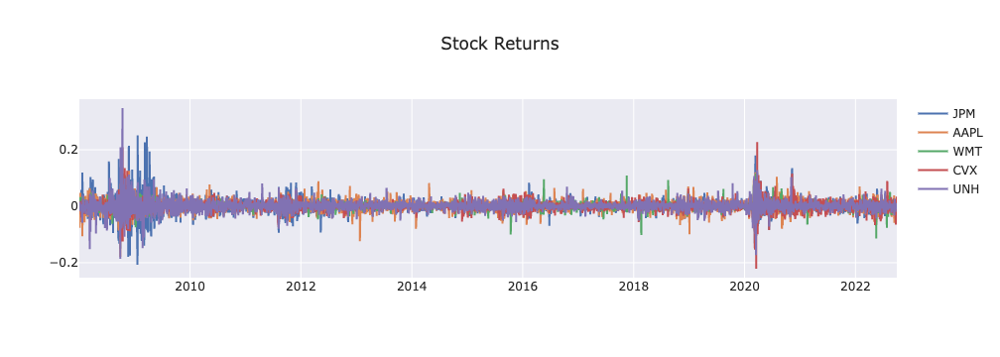

In [23]:
# Plot the returns for each stock

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=stock_returns.index,
        y=stock_returns['JPM_Returns'],
        name="JPM"
    ))

fig.add_trace(
    go.Scatter(
        x=stock_returns.index,
        y=stock_returns['AAPL_Returns'],
        name='AAPL'
    ))

fig.add_trace(
    go.Scatter(
        x=stock_returns.index,
        y=stock_returns['WMT_Returns'],
        name='WMT'
    ))

fig.add_trace(
    go.Scatter(
        x=stock_returns.index,
        y=stock_returns['CVX_Returns'],
        name='CVX'
    ))

fig.add_trace(
    go.Scatter(
        x=stock_returns.index,
        y=stock_returns['UNH_Returns'],
        name='UNH'
    ))

fig.update_layout(
    title={
        'text': "Stock Returns",
    },
    template=theme,
)

fig.show()

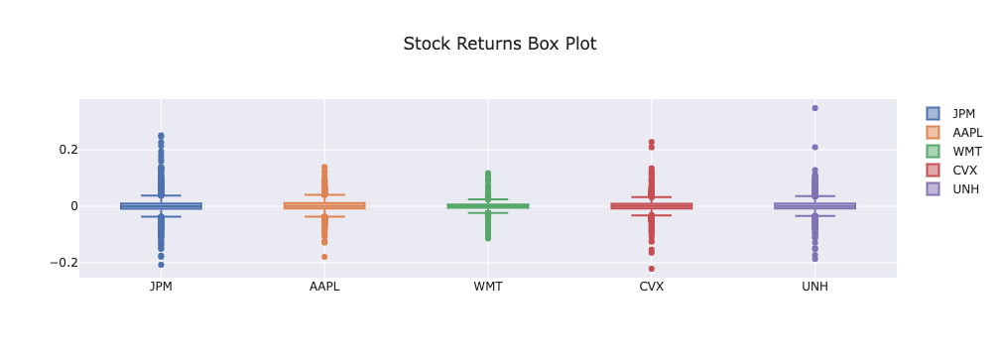

In [19]:
# Plot a Boxplot of each stocks returns

fig = go.Figure()

fig.add_trace(
    go.Box(
        y=stock_returns['JPM_Returns'],
        name="JPM"
    ))

fig.add_trace(
    go.Box(
        y=stock_returns['AAPL_Returns'],
        name='AAPL'
    ))

fig.add_trace(
    go.Box(
        y=stock_returns['WMT_Returns'],
        name='WMT'
    ))

fig.add_trace(
    go.Box(
        y=stock_returns['CVX_Returns'],
        name='CVX'
    ))

fig.add_trace(
    go.Box(
        y=stock_returns['UNH_Returns'],
        name='UNH'
    ))

fig.update_layout(
    title={
        'text': "Stock Returns Box Plot",
    },
    template=theme
)

fig.show()

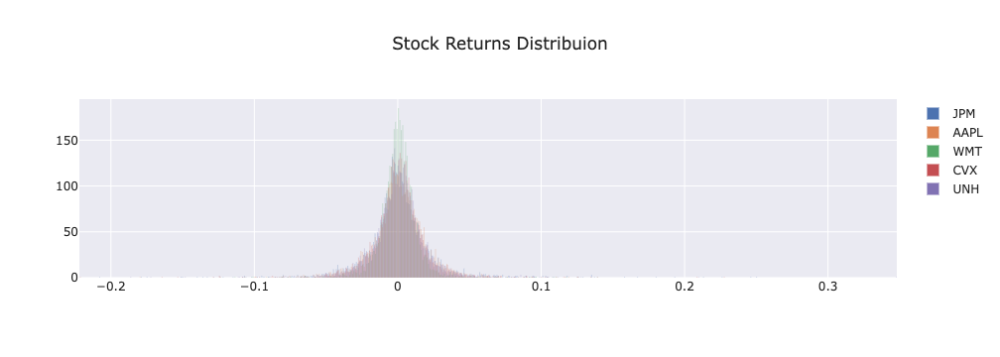

In [21]:
# Plot the histogram of the each stocks returns

fig = go.Figure()

fig.add_trace(
    go.Histogram(
        x=stock_returns['JPM_Returns'],
        name="JPM"
    ))

fig.add_trace(
    go.Histogram(
        x=stock_returns['AAPL_Returns'],
        name='AAPL'
    ))

fig.add_trace(
    go.Histogram(
        x=stock_returns['WMT_Returns'],
        name='WMT'
    ))

fig.add_trace(
    go.Histogram(
        x=stock_returns['CVX_Returns'],
        name='CVX'
    ))

fig.add_trace(
    go.Histogram(
        x=stock_returns['UNH_Returns'],
        name='UNH'
    ))

fig.update_layout(
    title={
        'text': "Stock Returns Distribuion",
    },
    template=theme
)

fig.show()

## Cumulative Stock Returns (Year 2008-2022)

In [24]:
# Calculate stocks cumulative returns

cumulative_returns = (1 + stock_returns).cumprod()
init_date = cumulative_returns.index[0] - timedelta(days=1)

cumulative_returns.loc[init_date] = 1
cumulative_returns = cumulative_returns.sort_index()

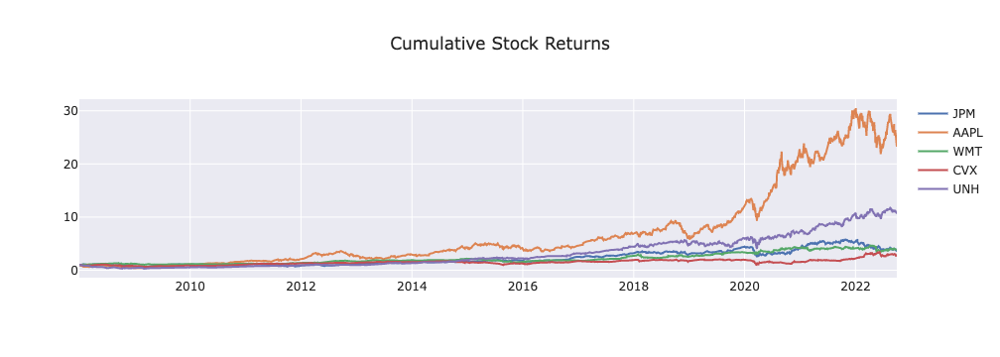

In [25]:
# Plot the stocks cumulative returns

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=cumulative_returns.index,
        y=cumulative_returns['JPM_Returns'],
        name="JPM"
    ))

fig.add_trace(
    go.Scatter(
        x=cumulative_returns.index,
        y=cumulative_returns['AAPL_Returns'],
        name='AAPL'
    ))

fig.add_trace(
    go.Scatter(
        x=cumulative_returns.index,
        y=cumulative_returns['WMT_Returns'],
        name='WMT'
    ))

fig.add_trace(
    go.Scatter(
        x=cumulative_returns.index,
        y=cumulative_returns['CVX_Returns'],
        name='CVX'
    ))

fig.add_trace(
    go.Scatter(
        x=cumulative_returns.index,
        y=cumulative_returns['UNH_Returns'],
        name='UNH'
    ))


fig.update_layout(
    title={
        'text': "Cumulative Stock Returns",
    },
    template=theme
)

fig.show()

In [26]:
# Calculate the Benchmark cumulative returns

cumulative_benchmark_returns = (1 + benchmark_returns).cumprod()
init_date = cumulative_benchmark_returns.index[0] - timedelta(days=1)

cumulative_benchmark_returns.loc[init_date] = 1
cumulative_benchmark_returns = cumulative_benchmark_returns.sort_index()

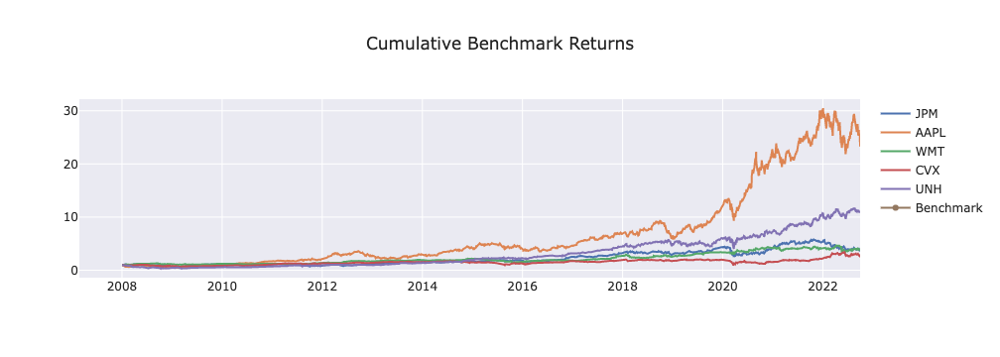

In [27]:
# Plot the cumulative benchmark returns

fig.add_trace(
    go.Scatter(
        x=cumulative_benchmark_returns.index,
        y=cumulative_benchmark_returns,
        name="Benchmark"
    ))

fig.update_layout(
    title={
        'text': "Cumulative Benchmark Returns",
    },
    template=theme
)

fig.show()

# Optimal Portfolio Weights Calculation

In [31]:
# Calculate Covariance matrix of the log stock returns. We use log as it produces marginally more accurate results.

cov_matrix = df.pct_change().apply(lambda x: np.log(1+x)).cov() 
cov_matrix

Symbols,JPM,AAPL,WMT,CVX,UNH
Symbols,,,,,
JPM,0.000639,0.000224,0.000106,0.000258,0.000220
AAPL,0.000224,0.000403,0.000085,0.000157,0.000167
WMT,0.000106,0.000085,0.000173,0.000079,0.000092
CVX,0.000258,0.000157,0.000079,0.000366,0.000186
UNH,0.000220,0.000167,0.000092,0.000186,0.000427


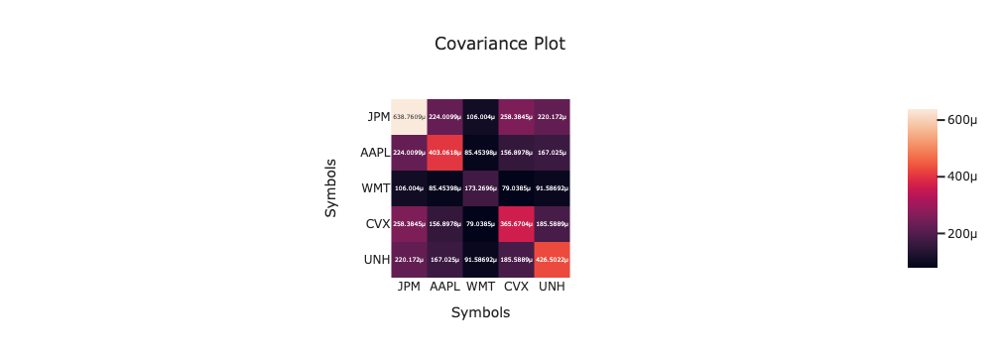

In [32]:
# Covariance matrix heatmap

fig = px.imshow(cov_matrix,text_auto=True, title='Covariance Plot', template=theme)
fig.show()

In [33]:
# Calculate Correlation matrix of the log stock returns. We use log as it produces marginally more accurate results.

corr_matrix = df.pct_change().apply(lambda x: np.log(1+x)).corr() #read up and explain
corr_matrix

Symbols,JPM,AAPL,WMT,CVX,UNH
Symbols,,,,,
JPM,1.000000,0.441481,0.318634,0.534629,0.421825
AAPL,0.441481,1.000000,0.323359,0.408683,0.402842
WMT,0.318634,0.323359,1.000000,0.314002,0.336908
CVX,0.534629,0.408683,0.314002,1.000000,0.469944
UNH,0.421825,0.402842,0.336908,0.469944,1.000000


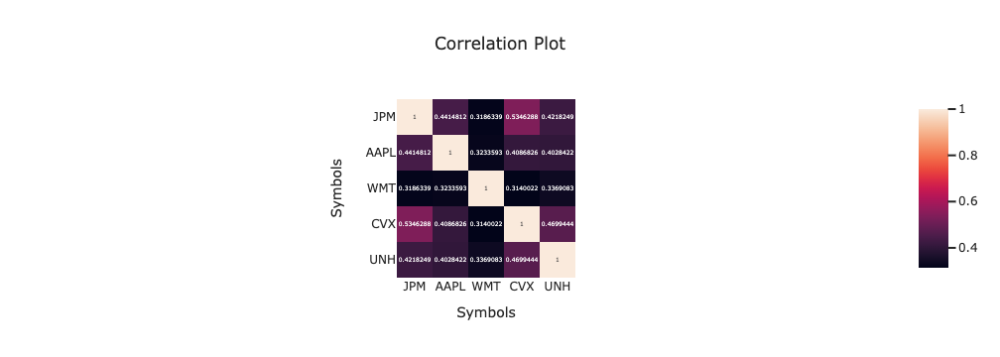

In [34]:
# Correlation matrix heatmap

fig = px.imshow(corr_matrix,text_auto=True, title='Correlation Plot', template=theme)
fig.show()

In [35]:
# Yearly returns for individual companies 

annual_returns = df.resample('Y').last().pct_change().mean()  #yearly average
#annual_returns

In [36]:
# Volatility is given by the annual standard deviation. We multiply by 252 because there are 252 trading days/year. Also
# We will use the log of the stock returns in our calculation as it produces mrginally more accurate results.

annual_std_dev = df.pct_change().apply(lambda x: np.log(1+x)).std().apply(lambda x: x*np.sqrt(252))
#annual_std_dev

In [37]:
#Concatenate the annual returns and standard deviation dataframes

risk_return = pd.concat([annual_returns, annual_std_dev], axis=1) # Creating a table for visualising returns and volatility of assets
risk_return.columns = ['Returns', 'Volatility']
risk_return

,Returns,Volatility
Symbols,,
JPM,0.142528,0.401208
AAPL,0.388136,0.318703
WMT,0.100137,0.208959
CVX,0.108164,0.303560
UNH,0.258574,0.327839


In [38]:
# Setup lists to hold portfolio weights, returns and volatility

p_ret = [] # Define an empty array for portfolio returns
p_vol = [] # Define an empty array for portfolio volatility
p_weights = [] # Define an empty array for asset weights

num_assets = len(df.columns)
num_portfolios = 10000

In [39]:
# Calculate Portfolio weights for num_portfolios

for portfolio in range(num_portfolios):
    weights = np.random.random(num_assets)
    weights = weights/np.sum(weights)
    p_weights.append(weights)
    returns = np.dot(weights, annual_returns) # Returns are the product of individual expected returns of asset and its 
                                      # weights 
    p_ret.append(returns)
    var = cov_matrix.mul(weights, axis=0).mul(weights, axis=1).sum().sum()# Portfolio Variance
    sd = np.sqrt(var) # Daily standard deviation
    ann_sd = sd*np.sqrt(252) # Annual standard deviation = volatility
    p_vol.append(ann_sd)

In [40]:
# Insert the stock weights that correspond to the respective portfolio return and volatility

data = {'Returns':p_ret, 'Volatility':p_vol}

for counter, symbol in enumerate(df.columns.tolist()):
    data[symbol+' weight'] = [w[counter] for w in p_weights]

In [41]:
# Create portfolios dataframe to hold the portfolio weights of stocks, and portfolio return, volatility and sharpe ratio

portfolios  = pd.DataFrame(data)

rf = 0.01
portfolios['Sharpe'] = (portfolios['Returns']-rf)/portfolios['Volatility']

portfolios.head() # Dataframe of the 10000 portfolios created

,Returns,Volatility,JPM weight,AAPL weight,WMT weight,CVX weight,UNH weight,Sharpe
0,0.213656,0.220055,0.133197,0.338101,0.260318,0.212900,0.055485,0.925475
1,0.158875,0.210990,0.065285,0.024308,0.362501,0.251571,0.296334,0.705600
2,0.240283,0.212172,0.009284,0.437468,0.375464,0.095773,0.082010,1.085358
3,0.183685,0.210451,0.105673,0.175297,0.302353,0.248877,0.167800,0.825300
4,0.175869,0.249782,0.327909,0.074759,0.156568,0.196343,0.244421,0.664057


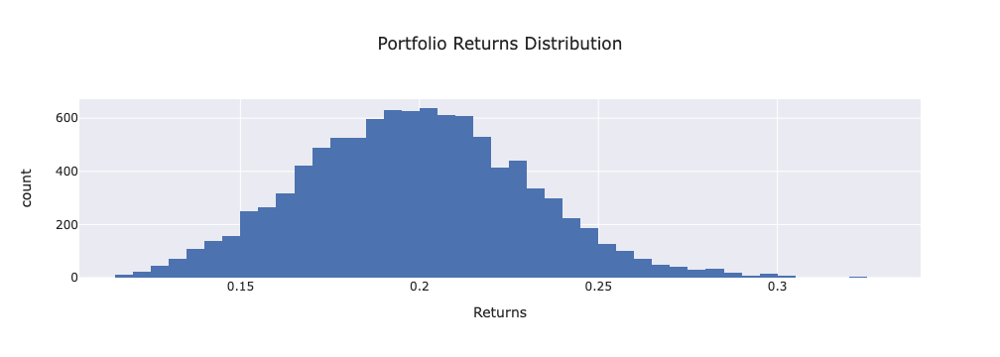

In [42]:
# Plot Portfolio Return Distribution

px.histogram(portfolios, x='Returns', nbins=50, title='Portfolio Returns Distribution', template=theme)

In [43]:
# Finding the optimal portfolio

rf = 0.01 # risk factor
optimal_risky_port = portfolios.iloc[(portfolios['Sharpe']).idxmax()]

optimal_risky_port

Returns        0.324799
Volatility     0.260489
JPM weight     0.015477
AAPL weight    0.683211
WMT weight     0.122806
CVX weight     0.006916
UNH weight     0.171590
Sharpe         1.208489
Name: 2717, dtype: float64

In [44]:
# create an optimal portfolio dataframe

optimal_port_df = pd.DataFrame(data={'Returns': optimal_risky_port[0], 'Volatility': optimal_risky_port[1]}, index=[0])
#optimal_port_df

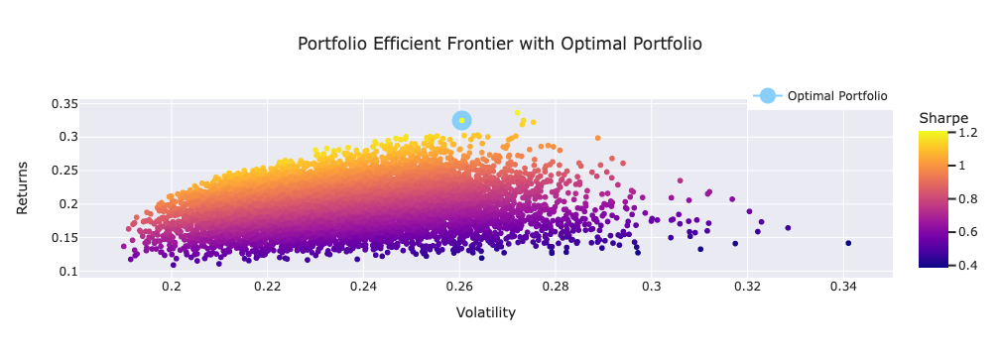

In [45]:
# Plot efficient frontier with optimal portfolio

fig = px.scatter(portfolios, x='Volatility', y='Returns', color='Sharpe', title='Portfolio Efficient Frontier with Optimal Portfolio')
fig.add_trace(go.Scatter(x=optimal_port_df['Volatility'], y=optimal_port_df['Returns'], name='Optimal Portfolio',
            marker=dict(
            color='LightSkyBlue',
            size=20,
            )))

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="top",
    y=1.1,
    xanchor="right",
    x=1
    ),
    template=theme
)
fig.show()

## Get Historical Optimal Portfolio Return using optimal weights

In [52]:
# Calculate Historical Optimal Portfolio Return using optimal weights

weights = optimal_risky_port[2:-1].values

weights_full = weights

portfolio_returns = stock_returns.dot(weights)

# Display sample data
portfolio_returns.sample(10)

Date
2019-07-18    0.004119
2009-11-09    0.029902
2012-05-21    0.045595
2012-09-10   -0.022067
2010-05-06   -0.034713
2014-09-26    0.021689
2017-12-05   -0.000840
2021-05-10   -0.015786
2013-04-01   -0.014792
2013-04-09    0.003438
dtype: float64

In [53]:
# Convert the historical optimal portfolio returns to a dataframe

port_returns = pd.DataFrame(portfolio_returns)
port_returns.columns = ['Portfolio_returns']

In [54]:
# Calculate the historical cumulative returns for the optimal portfolio

optimal_cumulative_returns = (1 + port_returns).cumprod()

init_date = optimal_cumulative_returns.index[0] - timedelta(days=1)
optimal_cumulative_returns.loc[init_date] = 1
optimal_cumulative_returns = optimal_cumulative_returns.sort_index()

In [58]:
# Concatenate the optimal and benchmark daily returns

historic_daily_returns = pd.concat([benchmark_returns, port_returns], axis=1, join="inner")

historic_daily_returns['Date'] = historic_daily_returns.index
historic_daily_returns['Date'] = historic_daily_returns['Date'].dt.date

historic_daily_returns

,BM_Returns,Portfolio_returns,Date
Date,,,
2008-01-03,0.000978,-0.000280,2008-01-03
2008-01-04,-0.019648,-0.057147,2008-01-04
2008-01-07,0.002134,-0.004128,2008-01-07
2008-01-08,-0.018587,-0.028856,2008-01-08
2008-01-09,0.011616,0.035279,2008-01-09
...,...,...,...
2022-09-26,-0.011139,0.000455,2022-09-26
2022-09-27,-0.004300,0.004020,2022-09-27
2022-09-28,0.018835,-0.004192,2022-09-28


In [59]:
#Here we concatenate the historical optimal cumulative portfolio returns with that of the benchmark

historic_returns = pd.concat([cumulative_benchmark_returns, optimal_cumulative_returns], axis=1, join="inner")

historic_returns['Date'] = historic_returns.index
historic_returns['Date'] = historic_returns['Date'].dt.date

historic_returns

,BM_Returns,Portfolio_returns,Date
Date,,,
2008-01-02,1.000000,1.000000,2008-01-02
2008-01-03,1.000978,0.999720,2008-01-03
2008-01-04,0.981311,0.942589,2008-01-04
2008-01-07,0.983405,0.938699,2008-01-07
2008-01-08,0.965126,0.911612,2008-01-08
...,...,...,...
2022-09-26,2.243246,20.539836,2022-09-26
2022-09-27,2.233600,20.622397,2022-09-27
2022-09-28,2.275669,20.535956,2022-09-28


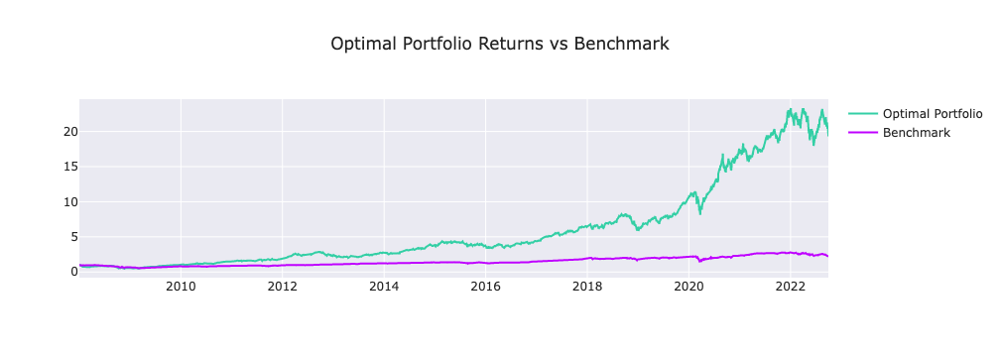

In [57]:
# Cumulative Historical Returns: Optimal Porfolio vs. Benchmark

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=historic_returns['Date'],
        y=historic_returns['Portfolio_returns'],
        name="Optimal Portfolio",
        line=dict(color="#33CFA5")
    ))

fig.add_trace(
    go.Scatter(
        x=historic_returns['Date'],
        y=historic_returns['BM_Returns'],
        name='Benchmark',
        line=dict(color="#bf00ff")
    ))


fig.update_layout(
    title={
        'text': "Optimal Portfolio Returns vs Benchmark",
    },
    template=theme
)

fig.show()

## Monte Carlo Simulation using full dataset

In [60]:
# Adjust stock dataframe for Monte Carlo Simulation 
df_mc = df.copy()

tickers = df_mc.columns.get_level_values(0).unique()

# Adjust dataframe to use in Monte Carlo Simulation
columns=[]
for ticker in tickers:
    tup = (ticker, 'close')
    columns.append(tup)
    
df_mc.columns=pd.MultiIndex.from_tuples(columns)

In [61]:
# Adjust stock dataframe for Monte Carlo Simulation 
bm_mc = bm.copy()

tickers = bm_mc.columns.get_level_values(0).unique()

# Adjust dataframe to use in Monte Carlo Simulation
columns=[]
for ticker in tickers:
    tup = (ticker, 'close')
    columns.append(tup)
    
bm_mc.columns=pd.MultiIndex.from_tuples(columns)

In [62]:
# Configuring a Monte Carlo simulation to forecast Optimal Portfolio cumulative returns

MC_sim = MCSimulation(
    portfolio_data = df_mc,
    weights = weights_full,
    num_simulation = number_simulation,
    num_trading_days = 252*years
)

/Users/janeydong/Desktop/portfolio-optimizer/MCForecastTools.py:53: FutureWarning:

elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison



In [63]:
# Check Monte Carlo portfolio data head

MC_sim.portfolio_data.head()

JPM                   AAPL                     WMT  \
                close daily_return     close daily_return      close   
Date                                                                   
2008-01-02  29.190405          NaN  5.941449          NaN  33.677521   
2008-01-03  28.989660    -0.006877  5.944196     0.000462  33.304134   
2008-01-04  28.332067    -0.022684  5.490445    -0.076335  32.830204   
2008-01-07  28.615870     0.010017  5.416954    -0.013385  33.433376   
2008-01-08  27.480656    -0.039671  5.222098    -0.035971  33.009716   

                               CVX                     UNH               
           daily_return      close daily_return      close daily_return  
Date                                                                     
2008-01-02          NaN  52.631077          NaN  46.735241          NaN  
2008-01-03    -0.011087  53.278675     0.012304  46.949669     0.004588  
2008-01-04    -0.014230  52.569134    -0.013318  46.182693    -0.016336  
2008-01-07     0.018372  51.882111    -0.013069  46.908432     0.015715  
2008-01-08    -0.012672  51.217609    -0.012808  46.355877    -0.011779

In [65]:
# Check Monte Carlo imulation cumulative returns dataframe

MC_sim.calc_cumulative_return()
MC_sim

/Users/janeydong/Desktop/portfolio-optimizer/MCForecastTools.py:117: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



In [ ]:
# Plot simulation outcomes
#line_plot = MC_sim.plot_simulation()

# Save the plot for future usage
#line_plot.get_figure().savefig("MC_30year_sim_plot.png", bbox_inches="tight")

In [ ]:
# Plot probability distribution and confidence intervals
#dist_plot = MC_sim.plot_distribution()

In [ ]:
# Fetch summary statistics from the Monte Carlo simulation results
statistics = MC_sim.summarize_cumulative_return()

# Print summary statistics
#print(statistics)

In [ ]:
# Set initial investment
initial_investment = init_investment

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our initial investment
ci_lower = round(statistics[8]*initial_investment,2)
ci_upper = round(statistics[9]*initial_investment,2)

# Print results
print("There is a 95% chance that an initial investment of ${:0,.2f} in the portfolio"
      " over the next 5 years will end within in the range of"
      " ${:0,.2f} and ${:0,.2f}".format(initial_investment, ci_lower, ci_upper))

In [ ]:
# Configuring a Monte Carlo simulation to forecast Benchmark cumulative returns
BM_sim = MCSimulation(
    portfolio_data = bm_mc,
    weights = [1],
    num_simulation = number_simulation,
    num_trading_days = 252*years
)

In [ ]:
# Check Monte Carlo portfolio data head

#BM_sim.portfolio_data.head()

In [ ]:
# Check Monte Carlo imulation cumulative returns dataframe

#BM_sim.calc_cumulative_return()

In [ ]:
# Plot simulation outcomes
#line_plot = BM_sim.plot_simulation()

# Save the plot for future usage
#line_plot.get_figure().savefig("MC_30year_sim_plot.png", bbox_inches="tight")

In [ ]:
# Plot probability distribution and confidence intervals
#dist_plot = BM_sim.plot_distribution()

In [ ]:
# Fetch summary statistics from the Monte Carlo simulation results
statistics = BM_sim.summarize_cumulative_return()

# Print summary statistics
#print(statistics)

In [ ]:
# Set initial investment
initial_investment = init_investment

# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our initial investment
ci_lower = round(statistics[8]*initial_investment,2)
ci_upper = round(statistics[9]*initial_investment,2)

# Print results
print("There is a 95% chance that an initial investment of ${:0,.2f} in the portfolio"
      " over the next 5 years will end within in the range of"
      " ${:0,.2f} and ${:0,.2f}".format(initial_investment, ci_lower, ci_upper))

## Full Data Descriptive Statistics

In [ ]:
#historic_daily_returns

In [ ]:
#historic_returns

# 

# Calulate Optimal Portfolio weights using sliced dataframe and optimal portfolio performance for out of sample data

In [66]:
# Calculate Covariance matrix of the log stock returns. We use log as it produces marginally more accurate results.

cov_matrix_excl = stock_returns_excl_ly.apply(lambda x: np.log(1+x)).cov()
cov_matrix

Symbols,JPM,AAPL,WMT,CVX,UNH
Symbols,,,,,
JPM,0.000639,0.000224,0.000106,0.000258,0.000220
AAPL,0.000224,0.000403,0.000085,0.000157,0.000167
WMT,0.000106,0.000085,0.000173,0.000079,0.000092
CVX,0.000258,0.000157,0.000079,0.000366,0.000186
UNH,0.000220,0.000167,0.000092,0.000186,0.000427


In [67]:
# Calculate Correlation matrix of the log stock returns. We use log as it produces marginally more accurate results.

corr_matrix = stock_returns_excl_ly.apply(lambda x: np.log(1+x)).corr()
corr_matrix

,JPM_Returns,AAPL_Returns,WMT_Returns,CVX_Returns,UNH_Returns
JPM_Returns,1.000000,0.439444,0.329340,0.550145,0.422082
AAPL_Returns,0.439444,1.000000,0.328072,0.423472,0.399797
WMT_Returns,0.329340,0.328072,1.000000,0.329938,0.340614
CVX_Returns,0.550145,0.423472,0.329938,1.000000,0.482762
UNH_Returns,0.422082,0.399797,0.340614,0.482762,1.000000


In [68]:
# Yearly returns for individual companies

annual_returns = stock_returns_excl_ly.resample('Y').last().mean()  #yearly average
#annual_returns

In [69]:
# Volatility is given by the annual standard deviation. We multiply by 252 because there are 252 trading days/year. Also
# We will use the log of the stock returns in our calculation as it produces mrginally more accurate results.

annual_std_dev = stock_returns_excl_ly.apply(lambda x: np.log(1+x)).std().apply(lambda x: x*np.sqrt(252))
#annual_std_dev

In [70]:
#Concatenate the annual returns and standard deviation dataframes

risk_return = pd.concat([annual_returns, annual_std_dev], axis=1) # Creating a table for visualising returns and volatility of assets
risk_return.columns = ['Returns', 'Volatility']
risk_return

,Returns,Volatility
JPM_Returns,0.005235,0.408701
AAPL_Returns,-0.000163,0.318593
WMT_Returns,-0.002111,0.204689
CVX_Returns,0.001300,0.303189
UNH_Returns,-0.002564,0.333417


In [71]:
# Setup lists to hold portfolio weights, returns and volatility

p_ret = [] # Define an empty array for portfolio returns
p_vol = [] # Define an empty array for portfolio volatility
p_weights = [] # Define an empty array for asset weights

num_assets = len(df.columns)
num_portfolios = 10000

In [72]:
# Calculate Portfolio weights for num_portfolios

for portfolio in range(num_portfolios):
    weights = np.random.random(num_assets)
    weights = weights/np.sum(weights)
    p_weights.append(weights)
    returns = np.dot(weights, annual_returns) # Returns are the product of individual expected returns of asset and its 
                                      # weights 
    p_ret.append(returns)
    var = cov_matrix.mul(weights, axis=0).mul(weights, axis=1).sum().sum()# Portfolio Variance
    sd = np.sqrt(var) # Daily standard deviation
    ann_sd = sd*np.sqrt(252) # Annual standard deviation = volatility
    p_vol.append(ann_sd)

In [73]:
# Insert the stock weights that correspon to the respective portfolio return and volatility

data = {'Returns':p_ret, 'Volatility':p_vol}

for counter, symbol in enumerate(df.columns.tolist()):
    data[symbol+' weight'] = [w[counter] for w in p_weights]

In [74]:
# Create portfolios dataframe to hold the portfolio weights of stocks, and portfolio return, volatility and sharpe ratio

portfolios  = pd.DataFrame(data)

rf = 0.01
portfolios['Sharpe'] = (portfolios['Returns']-rf)/portfolios['Volatility']

portfolios.head() # Dataframe of the 10000 portfolios created

,Returns,Volatility,JPM weight,AAPL weight,WMT weight,CVX weight,UNH weight,Sharpe
0,0.001313,0.238127,0.325561,0.226179,0.266229,0.174631,0.007400,-0.036479
1,0.001530,0.250095,0.429777,0.127671,0.292126,0.078595,0.071831,-0.033866
2,-0.000555,0.236684,0.136880,0.183903,0.159501,0.110740,0.408976,-0.044594
3,-0.000044,0.239266,0.085208,0.258274,0.066437,0.311836,0.278245,-0.041980
4,-0.000135,0.237827,0.134731,0.401511,0.132526,0.091601,0.239631,-0.042616


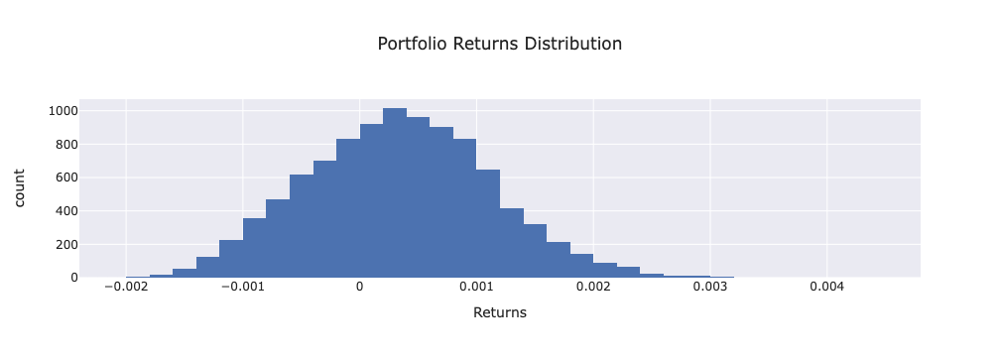

In [75]:
# Plot Portfolio Return Distribution

px.histogram(portfolios, x='Returns', nbins=50, title='Portfolio Returns Distribution', template=theme)

In [76]:
# Finding the optimal portfolio

rf = 0.01 # risk factor
optimal_risky_port = portfolios.iloc[(portfolios['Sharpe']).idxmax()]

optimal_risky_port

Returns        0.004673
Volatility     0.375040
JPM weight     0.901424
AAPL weight    0.038111
WMT weight     0.019822
CVX weight     0.027731
UNH weight     0.012912
Sharpe        -0.014203
Name: 8515, dtype: float64

In [77]:
# create an optimal portfolio dataframe

optimal_port_df = pd.DataFrame(data={'Returns': optimal_risky_port[0], 'Volatility': optimal_risky_port[1]}, index=[0])
#optimal_port_df

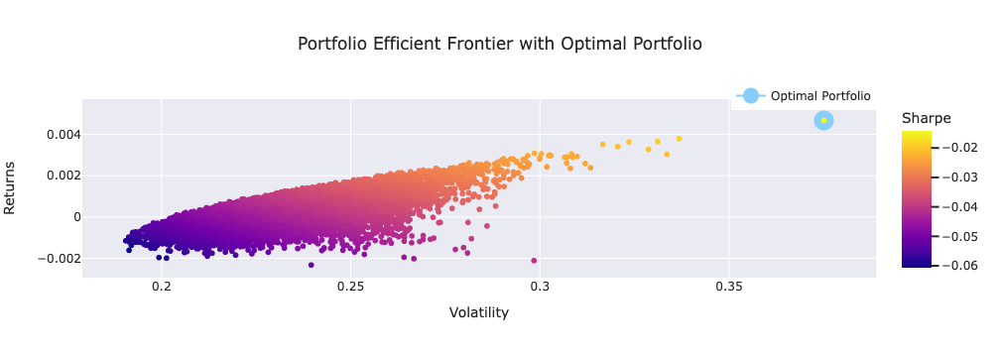

In [78]:
# Plot efficient frontier with optimal portfolio

fig = px.scatter(portfolios, x='Volatility', y='Returns', color='Sharpe', title='Portfolio Efficient Frontier with Optimal Portfolio')
fig.add_trace(go.Scatter(x=optimal_port_df['Volatility'], y=optimal_port_df['Returns'], name='Optimal Portfolio',
            marker=dict(
            color='LightSkyBlue',
            size=20,
            )))

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="top",
    y=1.1,
    xanchor="right",
    x=1
    ),
    template=theme
)
fig.show()

In [ ]:
# Calculate Historical Optimal Portfolio Return using optimal weights

weights = optimal_risky_port[2:-1].values

weights_excl_ly = weights

portfolio_returns = stock_returns_excl_ly.dot(weights)

# Display sample data
#portfolio_returns.sample(10)

In [ ]:
# Convert the historical optimal portfolio returns to a dataframe

port_returns = pd.DataFrame(portfolio_returns)
port_returns.columns = ['Portfolio_returns']

In [ ]:
# Calculate the historical cumulative returns for the optimal portfolio

optimal_cumulative_returns = (1 + port_returns).cumprod()

init_date = optimal_cumulative_returns.index[0] - timedelta(days=1)
optimal_cumulative_returns.loc[init_date] = 1
optimal_cumulative_returns = optimal_cumulative_returns.sort_index()

In [ ]:
#Here we concatenate the historical optimal daily portfolio returns with that of the benchmark

sample_daily_historic_returns = pd.concat([benchmark_returns_excl_ly, port_returns], axis=1, join="inner")
sample_daily_historic_returns['Date'] = sample_daily_historic_returns.index
sample_daily_historic_returns['Date'] = sample_daily_historic_returns['Date'].dt.date

In [ ]:
#Here we concatenate the historical optimal cumulative portfolio returns with that of the benchmark

sample_cumulative_historic_returns = pd.concat([cumulative_benchmark_returns, optimal_cumulative_returns], axis=1, join="inner")

sample_cumulative_historic_returns['Date'] = sample_cumulative_historic_returns.index
sample_cumulative_historic_returns['Date'] = sample_cumulative_historic_returns['Date'].dt.date

In [ ]:
# Cumulative Historical Returns: Optimal Porfolio vs. Benchmark

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=sample_cumulative_historic_returns['Date'],
        y=sample_cumulative_historic_returns['Portfolio_returns'],
        name="Optimal Portfolio",
        line=dict(color="#33CFA5")
    ))

fig.add_trace(
    go.Scatter(
        x=sample_cumulative_historic_returns['Date'],
        y=sample_cumulative_historic_returns['BM_Returns'],
        name='Benchmark',
        line=dict(color="#bf00ff")
    ))


fig.update_layout(
    title={
        'text': "Optimal Portfolio Returns vs Benchmark",
    },
    template=theme
)

fig.show()

## Generate animated graph for out of sample data (Optimal Portfolio vs. Benchmark)

In [ ]:
#Calculate portfolio returns for last year using updated weights

last_year_portfolio_returns = last_year_stock_returns.dot(weights_excl_ly)

# Display sample data
#last_year_portfolio_returns.sample(10)

In [ ]:
# Convert calulated portfolio returns for last year into a dataframe

one_year_port_returns = pd.DataFrame(last_year_portfolio_returns)
one_year_port_returns.columns = ['Portfolio_returns']

In [ ]:
# Calculate the cumulative returns for the optimal portfolio for the last year

one_year_cumulative_returns = (1 + one_year_port_returns).cumprod()

init_date = one_year_cumulative_returns.index[0] - timedelta(days=1)
one_year_cumulative_returns.loc[init_date] = 1
one_year_cumulative_returns = one_year_cumulative_returns.sort_index()

In [ ]:
# Calculate the cumulative returns for the benchmark for the last year

one_year_benchmark_returns = (1 + last_year_benchmark_returns).cumprod()

init_date = one_year_benchmark_returns.index[0] - timedelta(days=1)
one_year_benchmark_returns.loc[init_date] = 1
one_year_benchmark_returns = one_year_benchmark_returns.sort_index()

In [ ]:
# Concatenate the optimal and benchmark daily returns

one_year_historic_daily_returns = pd.concat([last_year_benchmark_returns, one_year_port_returns], axis=1, join="inner")

one_year_historic_daily_returns['Date'] = one_year_historic_daily_returns.index
one_year_historic_daily_returns['Date'] = one_year_historic_daily_returns['Date'].dt.date

In [ ]:
# Concatenate the optimal and benchmark cumulative returns

one_year_historic_returns = pd.concat([one_year_benchmark_returns, one_year_cumulative_returns], axis=1, join="inner")

one_year_historic_returns['Date'] = one_year_historic_returns.index
one_year_historic_returns['Date'] = one_year_historic_returns['Date'].dt.date

In [ ]:
# Plot An animated graphs of the optimal vs. Benchmark cumulative returns

fig = go.Figure(
    layout=go.Layout(
        updatemenus=[dict(type="buttons", direction="left", x=0.07, y=1.125), ],
        xaxis=dict(autorange=True, 
                   title_text="Date"),
        yaxis=dict(autorange=True,
                   title_text="Returns"),
        title="Out of Sample Optimal Portfolio Returns vs Benchmark",
    ))

# Add traces
init = 0


fig.add_trace(
    go.Scatter(
        x=one_year_historic_returns['Date'][:init],
        y=one_year_historic_returns['Portfolio_returns'][:init],
        name='Optimal Portfolio Returns',
        line=dict(color="#33CFA5")
    ))


fig.add_trace(
    go.Scatter(
        x=one_year_historic_returns['Date'][:init],
        y=one_year_historic_returns['BM_Returns'][:init],
        name='Benchmark Returns',
        line=dict(color="#bf00ff")
    ))


# Animation
fig.update(frames=[
    go.Frame(
        data=[
            go.Scatter(x=one_year_historic_returns['Date'][:k], y=one_year_historic_returns['Portfolio_returns'][:k]),
            go.Scatter(x=one_year_historic_returns['Date'][:k], y=one_year_historic_returns['BM_Returns'][:k])]
            
    )
    for k in range(init, one_year_historic_returns.shape[0])])



# Buttons
fig.update_layout(
    template=theme,
    updatemenus=[
        dict(
            buttons=list([
                dict(label="Play",
                     method="animate",
                    args=[None, {"frame": {"duration": 1}}])
            ]))])


fig.show()

# 

## Sample and Out-of-Sample Descriptive Statistics

In [ ]:
#sample_daily_historic_returns

In [ ]:
#sample_cumulative_historic_returns

In [ ]:
#one_year_historic_daily_returns

In [ ]:
#one_year_benchmark_returns